# Computational Text Analysis
## Day 2 — Distributional Semantics with Word2Vec

## 1. Load the model

In [2]:
import os
from pathlib import Path
from toolbox_ds import load_model

# === EDIT ME ===
MODEL_PATH = os.path.expanduser("../corpora/A_Small_Collection_of_British_Fiction/lemmatized_corpus_model/lemmatized_corpus.model")

MODEL, INFO = load_model(MODEL_PATH)

# A few values from INFO are useful downstream; surface them.
DIM = INFO["dim"]
VOCAB_SIZE = INFO["vocab_size"]

+----------------------+--------------------------------------------------------------------------------------------------+
| Property             | Value                                                                                            |
+----------------------+--------------------------------------------------------------------------------------------------+
| Path                 | ../corpora/A_Small_Collection_of_British_Fiction/lemmatized_corpus_model/lemmatized_corpus.model |
| Vocabulary size      | 19,344                                                                                           |
| Vector dimension     | 100                                                                                              |
| Window               | 5                                                                                                |
| Min count            | 5                                                                                                |
| Archit

## 2. Nearest neighbours — text

For each word in your list, the model returns the `top_n` closest
neighbours in the embedding space, ranked by cosine similarity. This is
the most direct probe of what the model has learned: words that appear
in similar contexts end up with similar vectors.

The table below shows results side by side, one column per input word.
Read it column-by-column.

In [5]:
from toolbox_ds import most_similar_table

# Pick words present in your model.
words = ["king", "queen", "man", "woman"]

most_similar_table(MODEL, words, top_n=10);

+----+------------+-----------+-------------+------------+------------+----------+-------------+------------+
| #  | king       | sim(king) | queen       | sim(queen) | man        | sim(man) | woman       | sim(woman) |
+----+------------+-----------+-------------+------------+------------+----------+-------------+------------+
| 1  | marquis    | 0.791     | housekeeper | 0.716      | woman      | 0.790    | creature    | 0.800      |
| 2  | prince     | 0.772     | king        | 0.705      | fellow     | 0.769    | man         | 0.790      |
| 3  | saint      | 0.742     | dunstan     | 0.702      | gentleman  | 0.754    | girl        | 0.776      |
| 4  | baron      | 0.727     | physician   | 0.698      | clergyman  | 0.738    | gentlewoman | 0.719      |
| 5  | barry      | 0.721     | saint       | 0.697      | person     | 0.692    | clergyman   | 0.718      |
| 6  | pope       | 0.712     | sinclair    | 0.683      | wretch     | 0.690    | person      | 0.696      |
| 7  | wel

## 3. Nearest neighbours — plot

Same data, plotted visually. Each input word has its own colour. The
x-axis is the neighbour's rank (1 = closest), the y-axis is the cosine
similarity. Each point is annotated with the neighbour word itself.

**What the shape tells you:**
- A high, flat line means the word has *many* tightly-clustered
  neighbours — a robust semantic field.
- A line that drops off quickly means the top one or two neighbours
  are very close but the rest scatter — a narrow semantic core.
- A consistently low line means the word lives in a sparse region of
  the embedding space, often because it's rare or polysemous.

Comparing two lines of different colours lets you spot which input
word is more semantically "anchored" in the corpus.

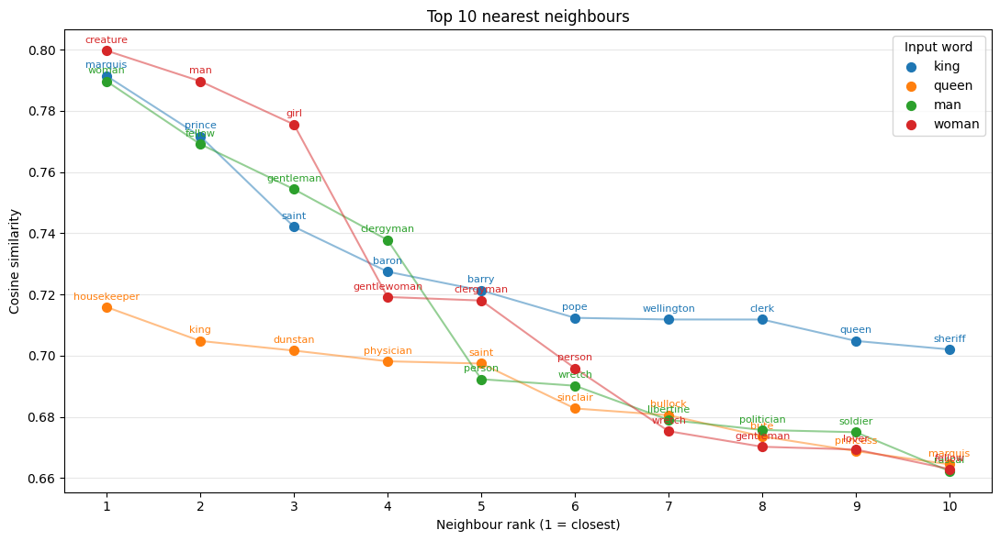

In [6]:
from toolbox_ds import most_similar_plot

most_similar_plot(MODEL, words, top_n=10);

## 4. Stage 1 — Project words onto semantic axes

Word2Vec embeddings encode many implicit dimensions. If we pick two
**word pairs** to define axes (e.g. `man → woman`, `poor → rich`),
we can project other words onto the resulting plane and see where
the model places them.

**The method:**

```
axis_vector = vec(positive_pole) − vec(negative_pole)
coord(w)    = cos(vec(w), axis_vector)
```

In words: each axis is the direction in vector space that points
*from* one pole *to* the other. Each word's coordinate on that
axis is how much it "points the same way".

**Use this to reveal cultural associations in your corpus.** Project a
list of professions onto `(man, woman)` and `(poor, rich)` axes, and
you can read off how the training text associates them with gender
and wealth. The model isn't biased on its own — it inherits whatever
associations its training corpus contained.

  ! skipping (not in vocab): scientist


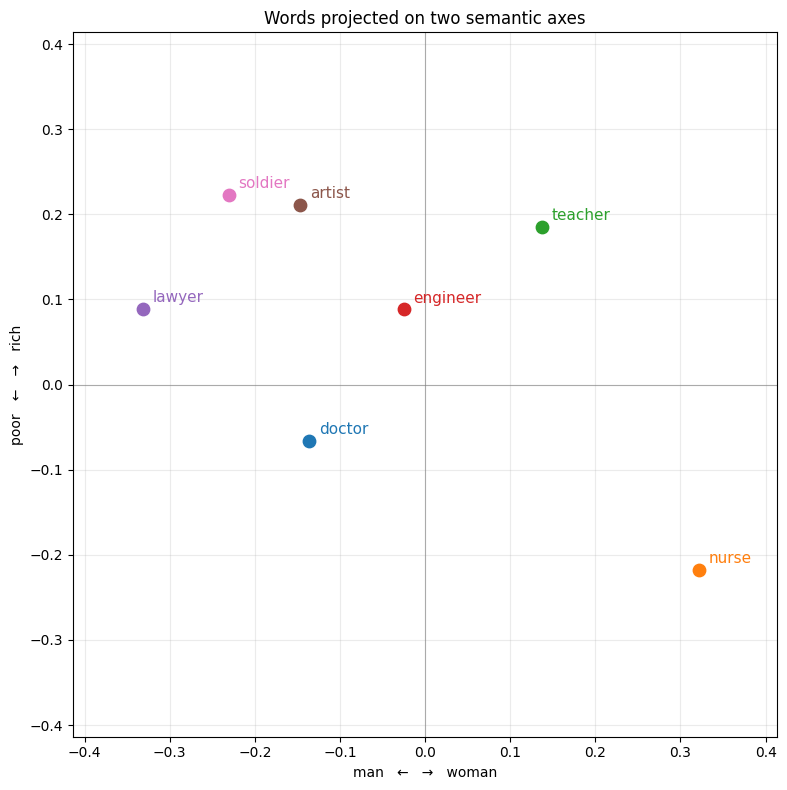

In [165]:
# Words to project — pick ones that exist in your vocabulary.
# DO NOT include the axis poles themselves; see Stage 2 below for why.
words_to_project = ["doctor", "nurse", "teacher", "engineer",
                    "lawyer", "scientist", "artist", "soldier"]

# Each axis is (negative_pole, positive_pole).
project_on_axes(
    MODEL,
    words_to_project,
    x_axis=("man",  "woman"),    # left ← → right
    y_axis=("poor", "rich"),     # bottom ↓ ↑ top
);

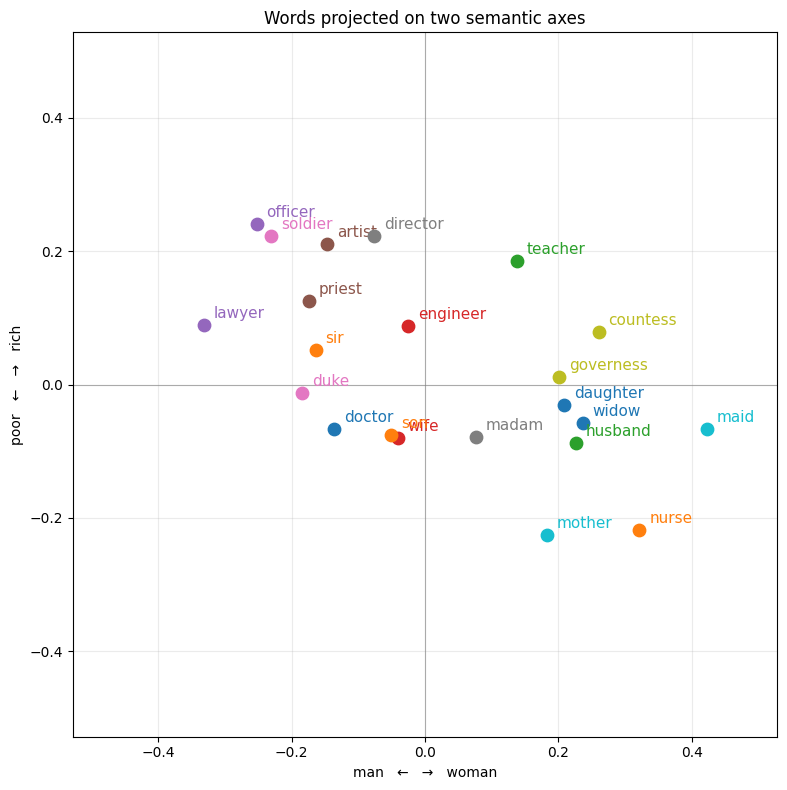

In [166]:
# Words to project — pick ones that exist in your vocabulary.
# DO NOT include the axis poles themselves; see Stage 2 below for why.
words_to_project = ["doctor", "nurse", "teacher", "engineer",
                    "lawyer", "artist", "soldier", "director", "countess", "mother",
                    "widow", "sir", "husband", "wife", "officer", "priest", "duke", "madam",
                    "governess", "maid", "daughter", "son"]

# Each axis is (negative_pole, positive_pole).
project_on_axes(
    MODEL,
    words_to_project,
    x_axis=("man",  "woman"),    # left ← → right
    y_axis=("poor", "rich"),     # bottom ↓ ↑ top
);

## 5. Stage 2 — Understanding the method (and its limits)

The plot above worked. Professions sit between the poles in ways that
loosely match real-world stereotypes. But the method has subtleties
worth knowing before you trust the numbers.

### A semantic axis is a measuring tool, not a thing to measure

<svg xmlns="http://www.w3.org/2000/svg" viewBox="0 0 640 280" width="640" height="280">
  <style>
    .lbl       { font-family: -apple-system, system-ui, sans-serif; font-size: 14px; }
    .lbl-small { font-family: -apple-system, system-ui, sans-serif; font-size: 11px; fill: #666; }
    .lbl-title { font-family: -apple-system, system-ui, sans-serif; font-size: 14px; font-weight: bold; }
    .tick      { stroke: #333; stroke-width: 1; }
    .axis-line { stroke: #2ca02c; stroke-width: 3; }
    .pole      { fill: #2ca02c; }
    .word      { fill: #555; }
  </style>

  <text x="320" y="24" text-anchor="middle" class="lbl-title">
    A semantic axis is a measuring tool, not a thing to measure
  </text>

  <!-- The axis itself -->
  <line x1="80" y1="120" x2="560" y2="120" class="axis-line"/>

  <!-- Pole markers -->
  <circle cx="80"  cy="120" r="8" class="pole"/>
  <circle cx="560" cy="120" r="8" class="pole"/>
  <text x="80"  y="100" text-anchor="middle" class="lbl" fill="#2ca02c">man</text>
  <text x="560" y="100" text-anchor="middle" class="lbl" fill="#2ca02c">woman</text>
  <text x="80"  y="155" text-anchor="middle" class="lbl-small">(negative pole)</text>
  <text x="560" y="155" text-anchor="middle" class="lbl-small">(positive pole)</text>

  <!-- Words being measured on the axis -->
  <circle cx="180" cy="120" r="5" class="word"/>
  <text   x="180" y="180" text-anchor="middle" class="lbl">engineer</text>

  <circle cx="270" cy="120" r="5" class="word"/>
  <text   x="270" y="180" text-anchor="middle" class="lbl">doctor</text>

  <circle cx="350" cy="120" r="5" class="word"/>
  <text   x="350" y="180" text-anchor="middle" class="lbl">teacher</text>

  <circle cx="470" cy="120" r="5" class="word"/>
  <text   x="470" y="180" text-anchor="middle" class="lbl">nurse</text>

  <!-- Caption -->
  <text x="320" y="235" text-anchor="middle" class="lbl-small">
    The poles DEFINE the axis. Other words are MEASURED against it.
  </text>
  <text x="320" y="252" text-anchor="middle" class="lbl-small">
    Asking "where is man on the (man, woman) axis?" is asking
  </text>
  <text x="320" y="268" text-anchor="middle" class="lbl-small">
    "how long is the metre stick, measured in metres?"
  </text>
</svg>

The two pole words **define** the axis. Other words are **measured**
against it. Asking "where does `man` sit on the (man, woman) axis?"
is like asking "how long is the metre stick, measured in metres?" —
the question is malformed.

In practice this means: **don't put the pole words in your
`words_to_project` list.** The previous cell did this correctly.

### What if we break the rule anyway?

Out of curiosity, let's violate the rule and see what happens. If
you project `man` and `woman` onto the (man, woman) axis, you might
expect them to land at the *extremes* — `man` at -1.0, `woman` at
+1.0. They don't. They land somewhere closer to ±0.6 (or even ±0.2
for a small corpus), with **opposite signs** but **not at the
extremes**. Why?

### What the axis actually is

<svg xmlns="http://www.w3.org/2000/svg" viewBox="0 0 720 380" width="720" height="380">
  <style>
    .grid { stroke: #ddd; stroke-width: 1; stroke-dasharray: 3 3; }
    .vec-man   { stroke: #1f77b4; stroke-width: 3; fill: none; }
    .vec-woman { stroke: #d62728; stroke-width: 3; fill: none; }
    .vec-axis  { stroke: #2ca02c; stroke-width: 3; fill: none; }
    .vec-axis-translated { stroke: #2ca02c; stroke-width: 2; fill: none; stroke-dasharray: 5 3; }
    .lbl       { font-family: -apple-system, system-ui, sans-serif; font-size: 14px; }
    .lbl-small { font-family: -apple-system, system-ui, sans-serif; font-size: 12px; fill: #444; }
    .lbl-title { font-family: -apple-system, system-ui, sans-serif; font-size: 16px; font-weight: bold; }
    .origin    { fill: #333; }
  </style>

  <text x="360" y="26" text-anchor="middle" class="lbl-title">
    What is the "axis" geometrically?
  </text>

  <!-- Plot area -->
  <line x1="60" y1="320" x2="420" y2="320" class="grid"/>
  <line x1="80" y1="50"  x2="80"  y2="340" class="grid"/>

  <!-- Origin -->
  <circle cx="80" cy="320" r="4" class="origin"/>
  <text x="80" y="348" text-anchor="middle" class="lbl-small">origin (0, 0)</text>

  <!-- vec(man) -->
  <line x1="80" y1="320" x2="340" y2="180" class="vec-man"/>
  <polygon points="340,180 330,186 332,175" fill="#1f77b4"/>
  <circle cx="340" cy="180" r="5" fill="#1f77b4"/>
  <text x="355" y="180" class="lbl" fill="#1f77b4" font-weight="bold">vec(man)</text>

  <!-- vec(woman) -->
  <line x1="80" y1="320" x2="400" y2="80" class="vec-woman"/>
  <polygon points="400,80 390,86 392,75" fill="#d62728"/>
  <circle cx="400" cy="80" r="5" fill="#d62728"/>
  <text x="350" y="68" class="lbl" fill="#d62728" font-weight="bold">vec(woman)</text>

  <!-- THE AXIS: arrow from man-tip to woman-tip -->
  <line x1="340" y1="180" x2="400" y2="80" class="vec-axis"/>
  <polygon points="400,80 388,78 396,88" fill="#2ca02c"/>
  <text x="402" y="130" class="lbl" fill="#2ca02c" font-weight="bold">axis</text>

  <!-- Same axis translated to origin (dashed) -->
  <line x1="80" y1="320" x2="140" y2="220" class="vec-axis-translated"/>
  <polygon points="140,220 130,222 134,212" fill="#2ca02c"/>
  <text x="148" y="228" class="lbl-small" fill="#2ca02c" font-style="italic">same arrow, slid to origin</text>

  <!-- Right-side simple explanation -->
  <text x="465" y="80" class="lbl" font-weight="bold">Geometrically:</text>
  <text x="465" y="105" class="lbl-small">
    The axis is the arrow from the tip of
  </text>
  <text x="465" y="123" class="lbl-small">
    vec(man) to the tip of vec(woman).
  </text>

  <text x="465" y="165" class="lbl" font-weight="bold">Algebraically:</text>
  <text x="465" y="190" class="lbl-small" font-family="ui-monospace, monospace">
    axis = vec(woman) − vec(man)
  </text>

  <text x="465" y="232" class="lbl" font-weight="bold">For projection:</text>
  <text x="465" y="257" class="lbl-small">
    A direction has no fixed start, so we
  </text>
  <text x="465" y="275" class="lbl-small">
    slide the axis to the origin (dashed).
  </text>
  <text x="465" y="293" class="lbl-small">
    Then we measure angles between it and
  </text>
  <text x="465" y="311" class="lbl-small">
    vec(man), vec(woman), and other words.
  </text>
</svg>

Three things to see:

- **vec(man)** and **vec(woman)** are the embeddings of the two pole
  words. Both start at the origin.
- **The axis (solid green)** is the arrow that goes *from the tip of
  vec(man) to the tip of vec(woman)*. Algebraically: `vec(woman) − vec(man)`.
  It does **not** start at the origin.
- **The dashed green arrow** is the same axis, slid to the origin.
  Geometrically a direction has no fixed starting point, so we're
  free to slide it wherever we want without changing what it
  represents. We slide it to the origin so we can compare its
  direction to the embedding vectors.

The projection formula `coord(w) = cos(vec(w), axis)` cares only
about *directions*: the angle between vec(w) and the axis arrow.

### Why opposite signs, but not ±1?

<svg xmlns="http://www.w3.org/2000/svg" viewBox="0 0 820 400" width="820" height="400">
  <style>
    .grid      { stroke: #ddd; stroke-width: 1; stroke-dasharray: 3 3; }
    .vec-man   { stroke: #1f77b4; stroke-width: 3; fill: none; }
    .vec-woman { stroke: #d62728; stroke-width: 3; fill: none; }
    .axis-line { stroke: #2ca02c; stroke-width: 3; fill: none; }
    .proj-line { stroke: #888; stroke-width: 1.5; fill: none; stroke-dasharray: 4 3; }
    .lbl       { font-family: -apple-system, system-ui, sans-serif; font-size: 14px; }
    .lbl-small { font-family: -apple-system, system-ui, sans-serif; font-size: 12px; fill: #444; }
    .lbl-tiny  { font-family: -apple-system, system-ui, sans-serif; font-size: 11px; fill: #555; }
    .lbl-title { font-family: -apple-system, system-ui, sans-serif; font-size: 16px; font-weight: bold; }
    .origin    { fill: #333; }
    .pole-mark { fill: #2ca02c; }
  </style>

  <text x="380" y="26" text-anchor="middle" class="lbl-title">
    Projecting vec(man) and vec(woman) onto the axis
  </text>

  <!-- LEFT: geometric setup (same as previous diagram, with vec(man) and vec(woman) and the axis arrow between them) -->
  <line x1="40"  y1="340" x2="380" y2="340" class="grid"/>
  <line x1="60"  y1="60"  x2="60"  y2="360" class="grid"/>

  <!-- Origin in the left subplot -->
  <circle cx="60" cy="340" r="4" class="origin"/>
  <text x="60" y="370" text-anchor="middle" class="lbl-small">origin</text>

  <!-- vec(man): from origin to (260, 200) -->
  <line x1="60" y1="340" x2="260" y2="200" class="vec-man"/>
  <polygon points="260,200 250,206 252,195" fill="#1f77b4"/>
  <circle cx="260" cy="200" r="5" fill="#1f77b4"/>
  <text x="200" y="195" class="lbl" fill="#1f77b4" font-weight="bold">vec(man)</text>

  <!-- vec(woman): from origin to (320, 100) -->
  <line x1="60" y1="340" x2="320" y2="100" class="vec-woman"/>
  <polygon points="320,100 310,106 312,95" fill="#d62728"/>
  <circle cx="320" cy="100" r="5" fill="#d62728"/>
  <text x="328" y="100" class="lbl" fill="#d62728" font-weight="bold">vec(woman)</text>

  <!-- The axis: from man-tip to woman-tip -->
  <line x1="260" y1="200" x2="320" y2="100" class="axis-line"/>
  <polygon points="320,100 308,98 316,108" fill="#2ca02c"/>
  <text x="317" y="155" class="lbl" fill="#2ca02c" font-weight="bold">axis</text>

  <text x="200" y="385" text-anchor="middle" class="lbl-small">
    Setup: two embeddings, plus the axis between them.
  </text>

  <!-- RIGHT: the axis projection number line -->
  <!-- We draw the axis as a horizontal line and mark where vec(man) and vec(woman) project. -->

  <text x="585" y="60" text-anchor="middle" class="lbl-title">
    Projections on the axis →
  </text>

  <!-- Number line representing the axis, with 0 in middle -->
  <line x1="430" y1="220" x2="740" y2="220" class="axis-line"/>
  <polygon points="740,220 732,215 732,225" fill="#2ca02c"/>

  <!-- Tick marks and labels: -1, 0, +1 -->
  <line x1="450" y1="215" x2="450" y2="225" stroke="#333"/>
  <text x="450" y="245" text-anchor="middle" class="lbl-small">−1</text>

  <line x1="585" y1="215" x2="585" y2="225" stroke="#333"/>
  <text x="585" y="245" text-anchor="middle" class="lbl-small">0</text>

  <line x1="720" y1="215" x2="720" y2="225" stroke="#333"/>
  <text x="720" y="245" text-anchor="middle" class="lbl-small">+1</text>

  <!-- vec(man) projects to about -0.6 (between 0 and -1) -->
  <circle cx="504" cy="220" r="6" fill="#1f77b4"/>
  <line x1="504" y1="220" x2="504" y2="160" class="proj-line"/>
  <text x="504" y="155" text-anchor="middle" class="lbl" fill="#1f77b4" font-weight="bold">man</text>
  <text x="504" y="138" text-anchor="middle" class="lbl-tiny" fill="#1f77b4">at ≈ −0.6</text>

  <!-- vec(woman) projects to about +0.6 -->
  <circle cx="666" cy="220" r="6" fill="#d62728"/>
  <line x1="666" y1="220" x2="666" y2="160" class="proj-line"/>
  <text x="666" y="155" text-anchor="middle" class="lbl" fill="#d62728" font-weight="bold">woman</text>
  <text x="666" y="138" text-anchor="middle" class="lbl-tiny" fill="#d62728">at ≈ +0.6</text>

  <!-- Caption under the number line -->
  <text x="585" y="290" text-anchor="middle" class="lbl-small">
    man lands negative, woman lands positive
  </text>
  <text x="585" y="310" text-anchor="middle" class="lbl-small">
    — but neither reaches the ±1 extremes.
  </text>

  <text x="585" y="350" text-anchor="middle" class="lbl-small" font-weight="bold">
    Different signs: the model separated them.
  </text>
  <text x="585" y="370" text-anchor="middle" class="lbl-small" font-weight="bold">
    Not ±1: the space isn't calibrated for that.
  </text>
</svg>

Now we project both pole vectors onto the axis and draw a number line
showing where each one lands.

- **vec(man) lands on the negative side.** The angle between
  vec(man) and the axis is obtuse (greater than 90°), so its cosine
  is negative. Intuitively: the axis points *away from* man — *toward*
  woman — so projecting vec(man) onto it gives a negative number.
- **vec(woman) lands on the positive side.** The axis points *toward*
  woman, so vec(woman) aligns with it. Positive cosine.
- **Neither reaches ±1.** That would require vec(man) and the axis
  to point in *exactly opposite* directions (and vec(woman) in
  *exactly the same* direction as the axis). That isn't true in
  general — the embedding space isn't calibrated so that pole words
  sit at the geometric extremes of every axis you might define from
  them.

**The smaller `cos(vec(neg_pole), vec(pos_pole))` is in your model,
the more "compressed" the axis appears.** If your model thinks `man`
and `woman` are very similar (cos ≈ 0.9), the two poles end up
squeezed close together on the axis number line — both might land
near ±0.2. If the model thinks they're distant (cos ≈ 0.1), the axis
is wide — closer to ±0.9.

### Try it: poles on the plot

The cell below repeats the projection but adds the pole words to the
input. Watch them land with opposite signs but well inside the
extremes — read the sections above for why.

In [ ]:
# Same call, but now we include the pole words. They will NOT land
# at ±1 on their own axis — read Stage 2 above for the reason.
project_on_axes(
    MODEL,
    ["doctor", "nurse", "teacher",
     "man", "woman", "poor", "rich"],   # poles included on purpose
    x_axis=("man",  "woman"),
    y_axis=("poor", "rich"),
);

## 5b. Going further — defining axes with SEED WORDS

Sometimes a candidate pole word doesn't quite mean what you think it
means in your corpus. A classic example: `poor` in a literary corpus
often appears as `poor boy`, `poor thing`, `poor creature` — expressing
*pity*, not *poverty*. Its vector reflects whichever sense was more
frequent in training. If you build the axis `("poor", "rich")`, the
axis ends up measuring something closer to *"pity vs prosperity"*
than *"economic poor vs economic rich"*.

This is a fundamental problem with single-word vectors: they cannot
distinguish word senses on their own. A single vector is a weighted
average over all the meanings the word had in training.

### The seed-words method

The classical remedy (Turney & Littman 2003; Bolukbasi et al. 2016)
is to define each pole not by ONE word but by a small **list of seed
words** that share the meaning we want. The pole vector is the
**centroid** (mean) of the seed vectors:

<svg xmlns="http://www.w3.org/2000/svg" viewBox="0 0 760 420" width="760" height="420">
  <style>
    .grid       { stroke: #ddd; stroke-width: 1; stroke-dasharray: 3 3; }
    .seed-neg   { stroke: #d62728; stroke-width: 2; fill: none; opacity: 0.55; }
    .seed-pos   { stroke: #1f77b4; stroke-width: 2; fill: none; opacity: 0.55; }
    .centroid-neg { fill: #d62728; }
    .centroid-pos { fill: #1f77b4; }
    .axis-arrow { stroke: #2ca02c; stroke-width: 3; fill: none; }
    .lbl        { font-family: -apple-system, system-ui, sans-serif; font-size: 13px; }
    .lbl-small  { font-family: -apple-system, system-ui, sans-serif; font-size: 12px; fill: #444; }
    .lbl-tiny   { font-family: -apple-system, system-ui, sans-serif; font-size: 11px; fill: #555; }
    .lbl-title  { font-family: -apple-system, system-ui, sans-serif; font-size: 16px; font-weight: bold; }
    .origin     { fill: #333; }
  </style>

  <text x="380" y="26" text-anchor="middle" class="lbl-title">
    Each pole is a CENTROID of several seed words
  </text>

  <!-- Left plot: vectors radiating from origin -->
  <line x1="40"  y1="360" x2="400" y2="360" class="grid"/>
  <line x1="60"  y1="60"  x2="60"  y2="380" class="grid"/>

  <circle cx="60" cy="360" r="4" class="origin"/>
  <text x="60" y="390" text-anchor="middle" class="lbl-small">origin</text>

  <!-- Negative pole seeds (red, transparent) — fanning out -->
  <line x1="60" y1="360" x2="170" y2="280" class="seed-neg"/>
  <line x1="60" y1="360" x2="155" y2="240" class="seed-neg"/>
  <line x1="60" y1="360" x2="180" y2="210" class="seed-neg"/>
  <text x="178" y="280" class="lbl-tiny" fill="#d62728">poor</text>
  <text x="163" y="235" class="lbl-tiny" fill="#d62728">destitute</text>
  <text x="188" y="208" class="lbl-tiny" fill="#d62728">poverty</text>

  <!-- Centroid of negative seeds (filled red circle) -->
  <circle cx="168" cy="243" r="8" class="centroid-neg"/>
  <text x="200" y="248" class="lbl" fill="#d62728" font-weight="bold">neg pole</text>
  <text x="200" y="262" class="lbl-tiny" fill="#d62728">(centroid)</text>

  <!-- Positive pole seeds (blue) -->
  <line x1="60" y1="360" x2="345" y2="155" class="seed-pos"/>
  <line x1="60" y1="360" x2="320" y2="120" class="seed-pos"/>
  <line x1="60" y1="360" x2="370" y2="130" class="seed-pos"/>
  <text x="353" y="155" class="lbl-tiny" fill="#1f77b4">rich</text>
  <text x="280" y="115" class="lbl-tiny" fill="#1f77b4">wealthy</text>
  <text x="378" y="128" class="lbl-tiny" fill="#1f77b4">wealth</text>

  <!-- Centroid of positive seeds -->
  <circle cx="345" cy="135" r="8" class="centroid-pos"/>
  <text x="280" y="100" class="lbl" fill="#1f77b4" font-weight="bold">pos pole (centroid)</text>

  <!-- Axis arrow between centroids -->
  <line x1="168" y1="243" x2="345" y2="135" class="axis-arrow"/>
  <polygon points="345,135 334,135 339,144" fill="#2ca02c"/>
  <text x="245" y="180" class="lbl" fill="#2ca02c" font-weight="bold">axis</text>

  <!-- Right panel: explanation -->
  <text x="445" y="80" class="lbl" font-weight="bold">How it works:</text>

  <text x="445" y="115" class="lbl-small">
    Each pole is built from several "seed"
  </text>
  <text x="445" y="133" class="lbl-small">
    words that share the meaning we want.
  </text>

  <text x="445" y="170" class="lbl-small">
    The POLE is the centroid (mean) of
  </text>
  <text x="445" y="188" class="lbl-small">
    its seed vectors:
  </text>

  <text x="465" y="218" class="lbl-tiny" font-family="ui-monospace, monospace">
    neg_pole = mean(vec("poor"),
  </text>
  <text x="465" y="234" class="lbl-tiny" font-family="ui-monospace, monospace">
                   vec("destitute"),
  </text>
  <text x="465" y="250" class="lbl-tiny" font-family="ui-monospace, monospace">
                   vec("poverty"))
  </text>

  <text x="445" y="288" class="lbl-small">
    The axis is then the arrow from the
  </text>
  <text x="445" y="306" class="lbl-small">
    negative centroid to the positive one.
  </text>

  <text x="445" y="345" class="lbl-small" font-weight="bold">
    Why it helps:
  </text>
  <text x="445" y="365" class="lbl-small">
    Senses unique to a single seed
  </text>
  <text x="445" y="383" class="lbl-small">
    cancel out; the SHARED meaning
  </text>
  <text x="445" y="401" class="lbl-small">
    survives in the average.
  </text>
</svg>

### Why centroids cancel out unwanted senses

Each seed has its own polysemy noise — but the noise tends to differ
between seeds, while the *target* sense is shared. When we average,
the shared component reinforces itself; the noise components point in
random directions and partially cancel:

<svg xmlns="http://www.w3.org/2000/svg" viewBox="0 0 760 420" width="760" height="420">
  <style>
    .grid       { stroke: #ddd; stroke-width: 1; stroke-dasharray: 3 3; }
    .vec-econ   { stroke: #1f77b4; stroke-width: 2; fill: none; }
    .vec-pity   { stroke: #ff7f0e; stroke-width: 2; fill: none; }
    .vec-mixed  { stroke: #888; stroke-width: 2.5; fill: none; }
    .vec-cent   { stroke: #2ca02c; stroke-width: 3; fill: none; }
    .lbl        { font-family: -apple-system, system-ui, sans-serif; font-size: 13px; }
    .lbl-small  { font-family: -apple-system, system-ui, sans-serif; font-size: 12px; fill: #444; }
    .lbl-tiny   { font-family: -apple-system, system-ui, sans-serif; font-size: 11px; fill: #555; }
    .lbl-title  { font-family: -apple-system, system-ui, sans-serif; font-size: 16px; font-weight: bold; }
    .origin     { fill: #333; }
  </style>

  <text x="380" y="26" text-anchor="middle" class="lbl-title">
    Why averaging cancels out unwanted senses
  </text>

  <!-- LEFT panel: just vec(poor) — mixed -->
  <text x="170" y="55" text-anchor="middle" class="lbl" font-weight="bold">
    Using only vec("poor"):
  </text>

  <line x1="40"  y1="320" x2="320" y2="320" class="grid"/>
  <line x1="60"  y1="80"  x2="60"  y2="340" class="grid"/>

  <circle cx="60" cy="320" r="3" class="origin"/>
  <text x="60" y="350" text-anchor="middle" class="lbl-tiny">origin</text>

  <!-- A "pity" direction (orange) -->
  <line x1="60" y1="320" x2="100" y2="160" class="vec-pity" stroke-dasharray="4 3"/>
  <text x="65" y="155" class="lbl-tiny" fill="#ff7f0e">"pity / poor boy"</text>
  <text x="65" y="170" class="lbl-tiny" fill="#ff7f0e">component</text>

  <!-- An "economic" direction (blue) -->
  <line x1="60" y1="320" x2="240" y2="270" class="vec-econ" stroke-dasharray="4 3"/>
  <text x="200" y="263" class="lbl-tiny" fill="#1f77b4">"economic"</text>
  <text x="220" y="278" class="lbl-tiny" fill="#1f77b4">component</text>

  <!-- The actual vec(poor) — pointing roughly between them, dominated by the more frequent sense -->
  <line x1="60" y1="320" x2="160" y2="200" class="vec-mixed"/>
  <polygon points="160,200 152,206 152,196" fill="#888"/>
  <text x="160" y="195" class="lbl" fill="#555" font-weight="bold">vec("poor")</text>

  <text x="170" y="385" text-anchor="middle" class="lbl-small">
    Single vector mixes both senses.
  </text>

  <!-- Vertical separator -->
  <line x1="400" y1="60" x2="400" y2="400" class="grid"/>

  <!-- RIGHT panel: centroid of seeds -->
  <text x="580" y="55" text-anchor="middle" class="lbl" font-weight="bold">
    Using centroid of multiple seeds:
  </text>

  <line x1="430" y1="320" x2="730" y2="320" class="grid"/>
  <line x1="450" y1="80"  x2="450" y2="340" class="grid"/>

  <circle cx="450" cy="320" r="3" class="origin"/>
  <text x="450" y="350" text-anchor="middle" class="lbl-tiny">origin</text>

  <!-- Several seed vectors, all leaning toward "economic" but with slightly different "noise" directions -->
  <!-- poor — same as before -->
  <line x1="450" y1="320" x2="550" y2="200" class="vec-mixed" stroke-dasharray="3 2"/>
  <text x="555" y="200" class="lbl-tiny" fill="#888">vec("poor")</text>

  <!-- destitute — leans more toward economic, less "pity" -->
  <line x1="450" y1="320" x2="600" y2="215" class="vec-mixed" stroke-dasharray="3 2"/>
  <text x="605" y="215" class="lbl-tiny" fill="#888">vec("destitute")</text>

  <!-- poverty — even more economic, almost no pity -->
  <line x1="450" y1="320" x2="640" y2="240" class="vec-mixed" stroke-dasharray="3 2"/>
  <text x="645" y="240" class="lbl-tiny" fill="#888">vec("poverty")</text>

  <!-- The centroid — green, average of the three -->
  <!-- Centroid roughly at ((550+600+640)/3, (200+215+240)/3) = (596, 218) -->
  <line x1="450" y1="320" x2="596" y2="218" class="vec-cent"/>
  <polygon points="596,218 588,224 587,214" fill="#2ca02c"/>
  <circle cx="596" cy="218" r="6" fill="#2ca02c"/>
  <text x="510" y="195" class="lbl" fill="#2ca02c" font-weight="bold">centroid</text>

  <text x="580" y="380" text-anchor="middle" class="lbl-small">
    "Pity" noise differs across seeds and averages out.
  </text>
  <text x="580" y="397" text-anchor="middle" class="lbl-small">
    The shared economic meaning survives.
  </text>
</svg>

**This is similar to averaging multiple noisy measurements of the
same physical quantity:** the signal stays, the noise averages
toward zero.

### Practical tips for choosing seeds

- **3–10 seeds per pole** is usually enough. More helps but with
  diminishing returns.
- **Mix parts of speech** if you can: `("poor", "destitute", "poverty", "needy")` mixes adjectives and a noun. Different POS share the target
  meaning but have different polysemy noise — exactly what you want.
- **Avoid seeds that share the same polysemy.** Adding `pitiful` to
  the `poor`-side would reinforce the pity-noise instead of cancelling
  it.
- **The function silently skips seeds that aren't in the vocabulary**
  and prints a warning. A pole is invalid only if all its seeds are
  missing.

The original `project_on_axes` function is unchanged — use that when
your poles are unambiguous (e.g. `("man", "woman")`). When polysemy
gets in the way, switch to `project_on_seed_axes` below.

  ! skipping (not in vocab): beaker


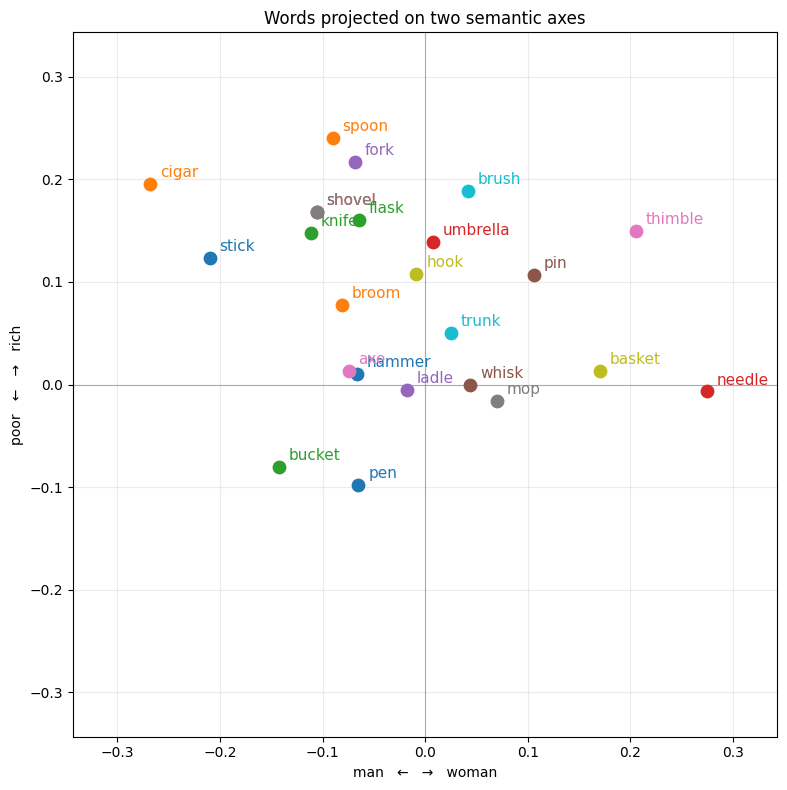

In [204]:
# Words to project — pick ones that exist in your vocabulary.
# DO NOT include the axis poles themselves; see Stage 2 below for why.
words_to_project = ["hammer", "spoon", "knife", "needle", "fork", "pin", "thimble", "mop", "basket",
                    "brush", "stick", "broom", "bucket", "shovel", "ladle", "whisk",
                    "axe", "shovel", "hook", "trunk", "pen", "cigar", "flask", "beaker", "umbrella"]

# Each axis is (negative_pole, positive_pole).
project_on_axes(
    MODEL,
    words_to_project,
    x_axis=("man",  "woman"),    # left ← → right
    y_axis=("poor", "rich"),     # bottom ↓ ↑ top
);

  ! input words not in vocab: ['beaker']


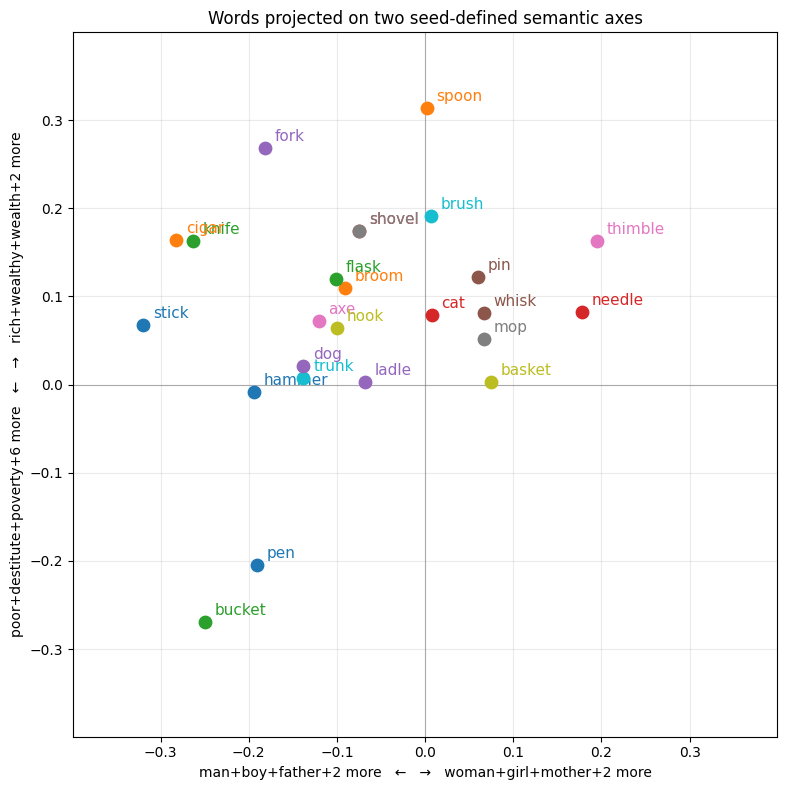

In [ ]:
# Same projection task as before, but each pole is now a centroid of
# several seed words. Notice we DO NOT include any seed words in
# `words_to_project` (just as before — seeds define the axis).

import importlib
import toolbox_ds
importlib.reload(toolbox_ds)
from toolbox_ds import project_on_seed_axes

words_to_project = ["hammer", "spoon", "knife", "needle", "fork", "pin", "thimble", "mop", "basket",
                    "brush", "stick", "broom", "bucket", "shovel", "ladle", "whisk",
                    "axe", "shovel", "hook", "trunk", "pen", "cigar", "flask", "beaker"]


project_on_seed_axes(
    MODEL,
    words_to_project,
    x_axis=(
        ["man",  "boy",  "father", "son", "male"],     # neg pole seeds
        ["woman", "girl", "mother", "daughter", "female"],  # pos pole seeds
    ),
    y_axis=(
        ["poor", "destitute", "poverty", "needy", "penniless", "pauper", "indigent", "parish", "hardship"],
        ["rich", "wealthy",   "wealth",  "affluent", "prosperous"],
    ),
);

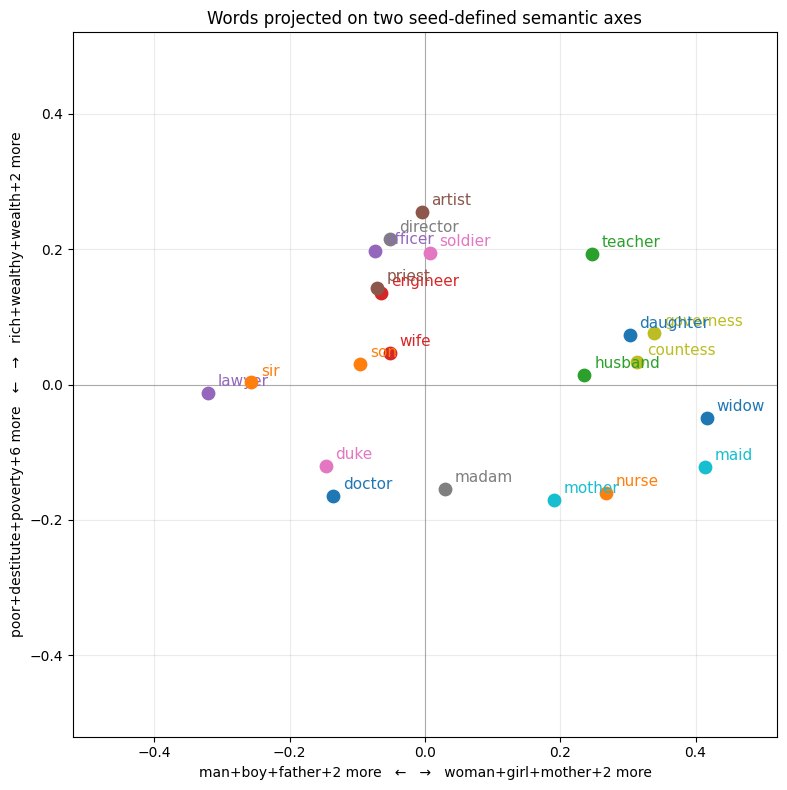

In [180]:
# Same projection task as before, but each pole is now a centroid of
# several seed words. Notice we DO NOT include any seed words in
# `words_to_project` (just as before — seeds define the axis).

import importlib
import toolbox_ds
importlib.reload(toolbox_ds)
from toolbox_ds import project_on_seed_axes



words_to_project = ["doctor", "nurse", "teacher", "engineer",
                    "lawyer", "artist", "soldier", "director", "countess", "mother",
                    "widow", "sir", "husband", "wife", "officer", "priest", "duke", "madam",
                    "governess", "maid", "daughter", "son"]

project_on_seed_axes(
    MODEL,
    words_to_project,
    x_axis=(
        ["man",  "boy",  "father", "son", "male"],     # neg pole seeds
        ["woman", "girl", "mother", "daughter", "female"],  # pos pole seeds
    ),
    y_axis=(
        ["poor", "destitute", "poverty", "needy", "penniless", "pauper", "indigent", "parish", "hardship"],
        ["rich", "wealthy",   "wealth",  "affluent", "prosperous"],
    ),
);

## 6. PCA in 2D

The previous plot fixed two semantic axes by hand. PCA does the opposite:
it finds the **two axes that carry the most variance** in the set of
vectors you give it, with no input from you.

For each input word, we add its `top_n` nearest neighbours to the set,
then reduce the whole pile to 2D. Each cluster gets its own colour. The
hope is to see input words sitting in clearly separated regions, each
surrounded by its neighbours.

- `hull=True` draws a convex hull around each cluster.
- `colors=` can be a dict like `{"women": "red", "men": "blue"}`.
- `extra=` adds extra words to the plot that are not seeds (they show
  up in grey squares); useful for asking *"where does X fall relative
  to my reference clusters?"*.

If your clusters overlap heavily it means the two principal components
don't separate them — either the words are genuinely similar in the
corpus, or you need more PCs (see the 3D version next).

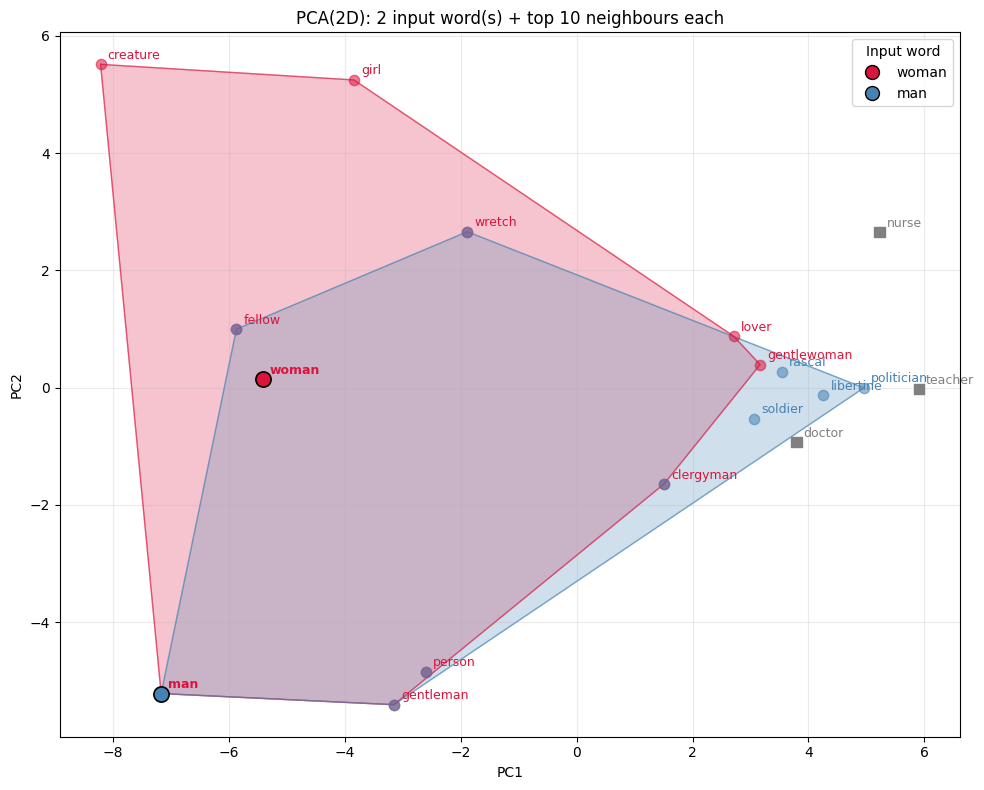

In [7]:
from toolbox_ds import pca_2d

pca_2d(
    MODEL,
    words=["woman", "man"],
    top_n=10,
    extra=["doctor", "nurse", "teacher"],
    hull=True,
    colors={"woman": "crimson", "man": "steelblue"},
);

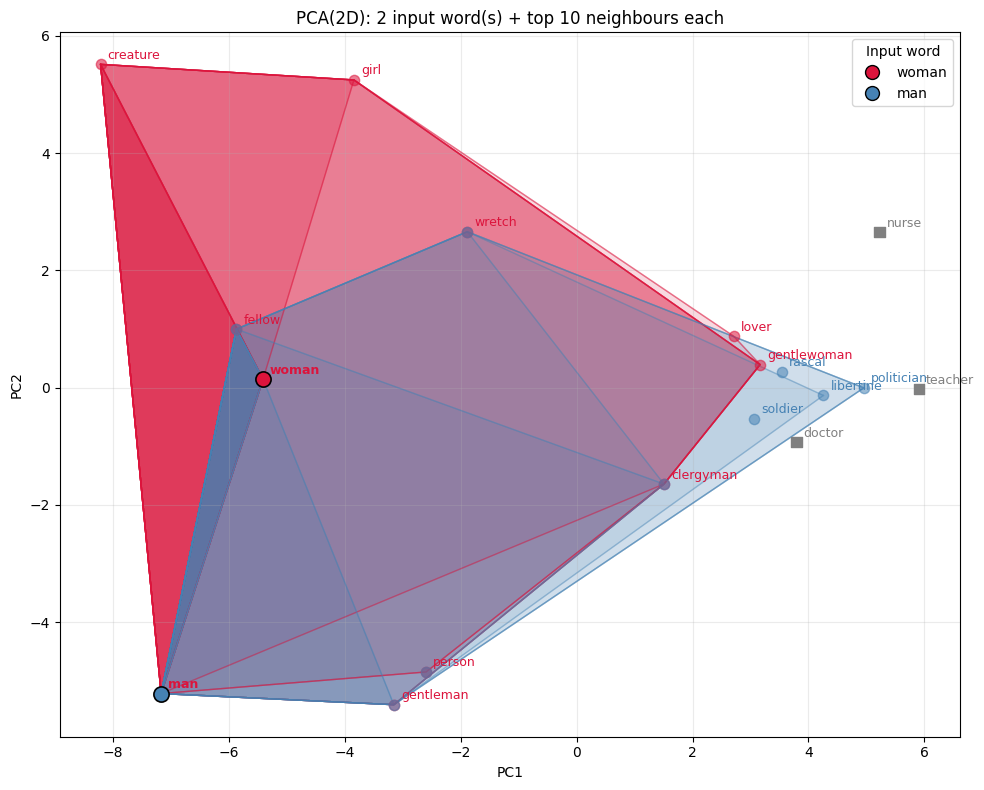

In [183]:

pca_2d(
    MODEL,
    words=["woman", "man"],
    top_n=10,
    extra=["doctor", "nurse", "teacher"],
    hull=True,
    colors={"woman": "crimson", "man": "steelblue"},
    hull_layers=10
);

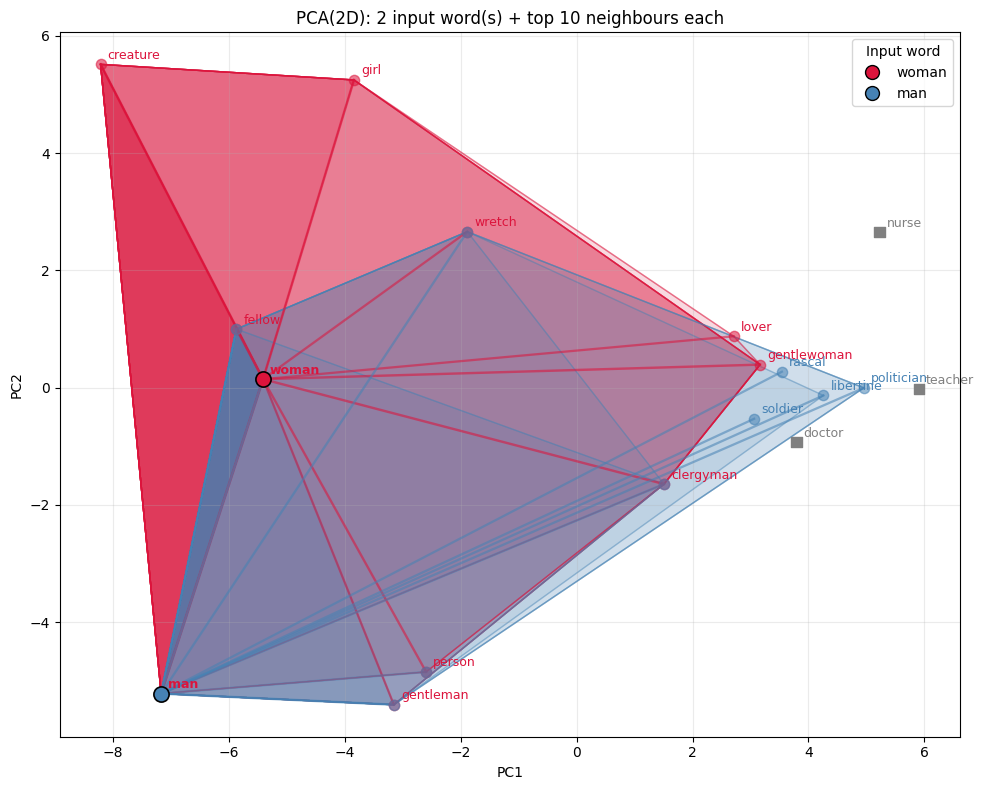

In [184]:
pca_2d(
    MODEL,
    words=["woman", "man"],
    top_n=10,
    extra=["doctor", "nurse", "teacher"],
    hull=True,
    colors={"woman": "crimson", "man": "steelblue"},
    hull_layers=10,
    connect_to_input=True
);

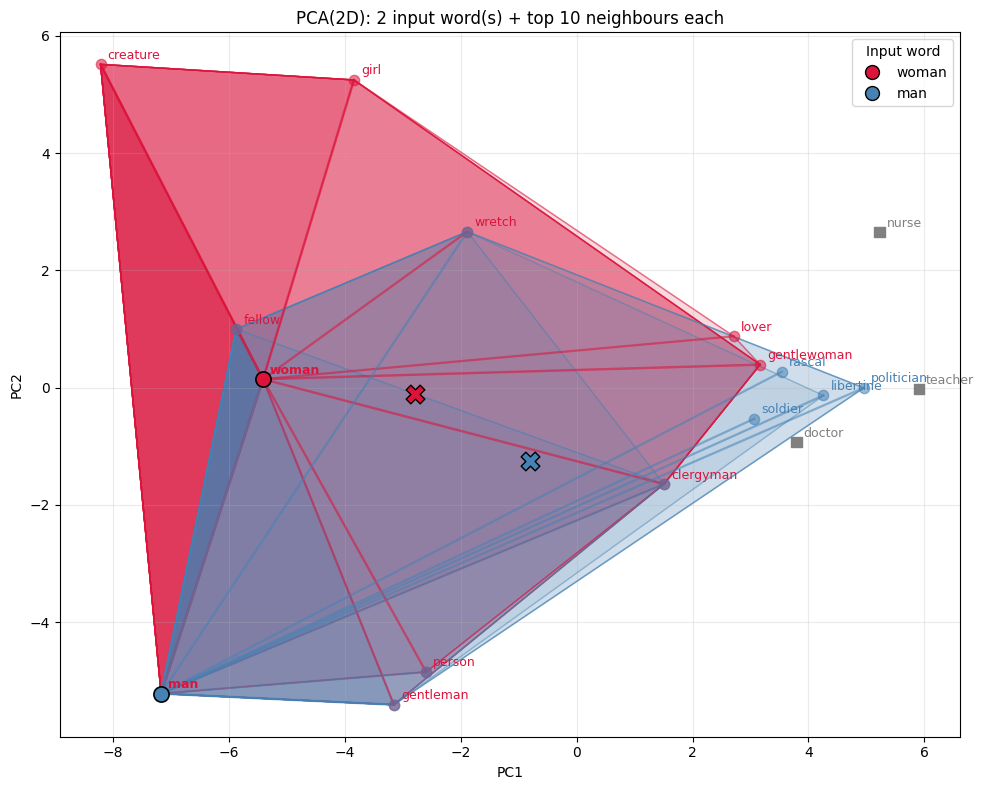

In [200]:
# Show centroid of each hull as a cross; this is the "average" location of all words in the hull, and is often more stable than the individual pole words.
pca_2d(
    MODEL,
    words=["woman", "man"],
    top_n=10,
    extra=["doctor", "nurse", "teacher"],
    hull=True,
    colors={"woman": "crimson", "man": "steelblue"},
    hull_layers=10,
    connect_to_input=True,
    show_centroid=True
);

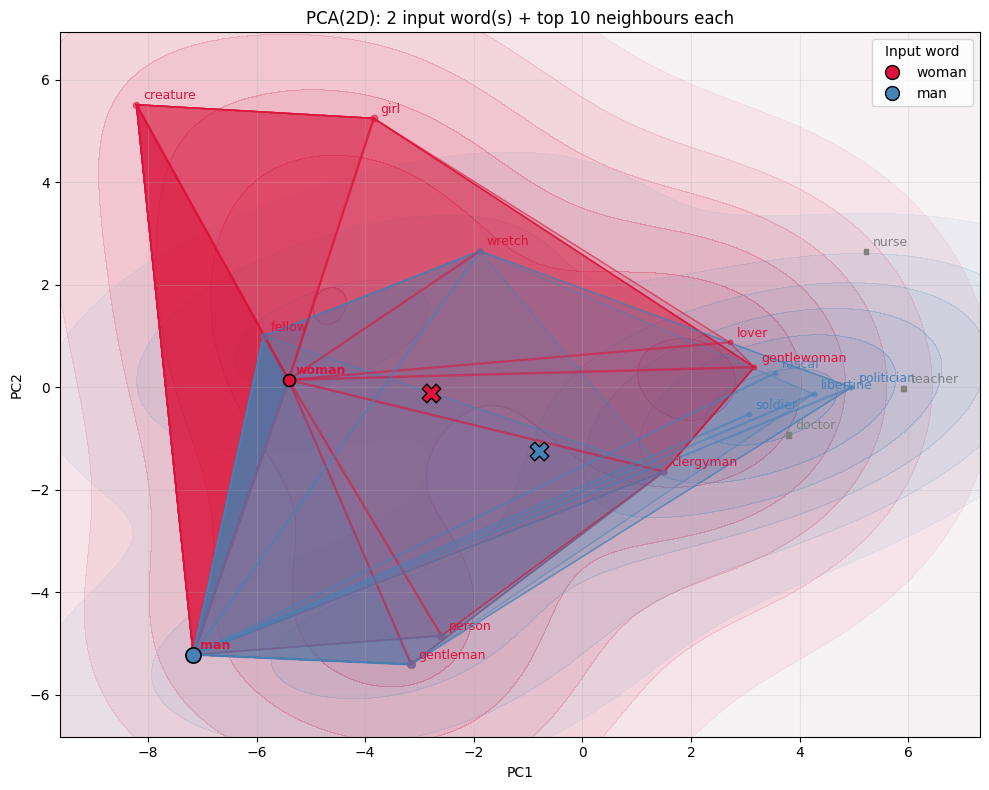

In [8]:
# Show centroid of each hull as a cross; this is the "average" location of all words in the hull, 
# and is often more stable than the individual pole words.
pca_2d(
    MODEL,
    words=["woman", "man"],
    top_n=10,
    extra=["doctor", "nurse", "teacher"],
    hull=True,
    colors={"woman": "crimson", "man": "steelblue"},
    hull_layers=10,
    connect_to_input=True,
    show_centroid=True,
    density=True,
    size_by_count=True
);

## 7. PCA in 3D (rotating)

Same idea, one more dimension. With three PCs you usually see structure
that 2D flattens together — clusters that overlap in 2D may pull apart
in 3D. The plot rotates so you can inspect the cloud from every angle.

`frames` controls smoothness vs. file size: 60 is a smooth half-second
spin; bump to 120 for a slower rotation or down to 30 for a quick
preview.

> The animation object is returned; render it with `HTML(anim.to_jshtml())`
> for in-notebook playback, or save to disk with
> `anim.save("rotation.gif", writer="pillow", fps=20)`.

In [9]:
from toolbox_ds import pca_3d
from IPython.display import HTML

anim = pca_3d(
    MODEL,
    words=["cat", "dog"],
    top_n=10,
    extra=["doctor", "nurse", "teacher"],
    colors={"woman": "crimson", "man": "steelblue"},
    frames=60,
    hull=True,
    show_centroid=True,
    hull_layers=10
)

HTML(anim.to_jshtml())

## 8. Analogies — the canonical Word2Vec demo

The famous one: `king − man + woman = queen`. The intuition is that
the embedding encodes the gender relation as a roughly-consistent
*direction* in vector space; subtracting "man" from "king" cancels the
"royalty + maleness" mix down to "royalty", and adding "woman" puts the
maleness back as femaleness.

This works *when the relation is well-attested in the corpus*. On small
or noisy training data, analogies often fail. A wrong answer is not
necessarily a bug — it can be a faithful reflection of what the model
could and could not learn from the data it saw.

Read `analogy(M, a, b, c)` as: *"`a` is to `b` as `c` is to ?"*.

In [10]:
from toolbox_ds import analogy

# "man is to king as woman is to ?" — expect "queen" on a good corpus.
analogy(MODEL, "man", "king", "woman", top_n=5);

+------------------------+------------+
| man : king ≈ woman : ? | similarity |
+------------------------+------------+
| queen                  | 0.726      |
| sinclair               | 0.714      |
| countess               | 0.702      |
| dowager                | 0.701      |
| saint                  | 0.697      |
+------------------------+------------+


## 9. Odd one out

Given a small set of words, pick the one whose vector is furthest from
the mean of the others. A one-line demo that the model has learned
semantic categories: in `[breakfast, cereal, dinner, lunch]`, the model
should pick out `dinner`, since `breakfast`, `cereal`, and `lunch` share
a morning/food-item theme that `dinner` does not.

Like analogies, this can fail in instructive ways on small corpora.

In [ ]:
from toolbox_ds import odd_one_out

odd_one_out(MODEL, ["breakfast", "cereal", "dinner", "lunch"]);

## 10. Pairwise similarity heatmap

The most direct view of the embedding space: a matrix of cosine
similarities between every pair of words. Block-diagonal patches
indicate semantic groups; a flat/uniform matrix means the model didn't
learn distinctions between the words you chose.

This view is useful **before** reaching for PCA — the matrix shows the
raw structure that PCA tries to compress into 2 or 3 axes. If the
matrix is featureless, PCA can't manufacture clusters from nothing.

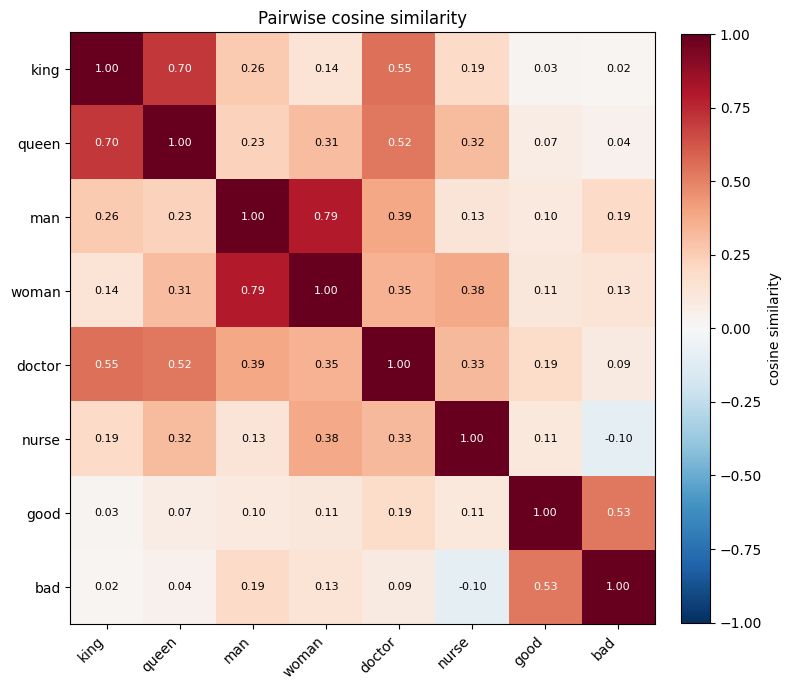

In [11]:
from toolbox_ds import similarity_matrix

similarity_matrix(
    MODEL,
    ["king", "queen", "man", "woman",
     "doctor", "nurse",
     "good", "bad"],
);

## Where to go from here

A few avenues for further exploration:

- **Cluster discovery.** Run k-means or HDBSCAN on a subset of the
  vocabulary; inspect each cluster's most central word.
- **Word2Vec vs. fastText.** Train fastText on the same corpus and
  compare neighbours for rare words — fastText handles morphology
  through subword units, which often helps for inflected languages.
- **Diachronic comparison.** If you have a corpus split into time
  periods, train one model per period and align them (e.g. with
  orthogonal Procrustes); then track how a word's neighbours shift
  over time.
- **Sentence/document embeddings.** Word2Vec gives word vectors. For
  whole-text vectors, average word vectors weighted by TF-IDF, or
  switch to a transformer-based encoder.